<a href="https://colab.research.google.com/github/Kapil-Mulay-1421/brain_tumor_dataset_augmentation/blob/main/TumorGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
project_name = 'tumor-dcgan'

In [2]:
!pip install opendatasets --upgrade --quiet

Datasets:
1. https://www.kaggle.com/datasets/jakeshbohaju/brain-tumor
  -> CSV class=1
2. https://www.kaggle.com/datasets/masoudnickparvar/brain-tumor-mri-dataset -> 3 classes of tumor
3. https://www.kaggle.com/datasets/sartajbhuvaji/brain-tumor-classification-mri -> 3 classes of tumor
5. https://www.kaggle.com/datasets/ahmedhamada0/brain-tumor-detection -> yes folder
6. https://www.kaggle.com/datasets/navoneel/brain-mri-images-for-brain-tumor-detection -> yes folder


In [3]:
import opendatasets as od

dataset1_url = 'https://www.kaggle.com/datasets/jakeshbohaju/brain-tumor'
od.download(dataset1_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: kapilmulay
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/jakeshbohaju/brain-tumor


100%|██████████| 14.0M/14.0M [00:00<00:00, 1.49GB/s]

In [20]:
import os
import shutil

In [15]:
print(os.listdir('./brain-tumor/Brain Tumor/Brain Tumor')[:10])

['Image712.jpg', 'Image231.jpg', 'Image2615.jpg', 'Image177.jpg', 'Image718.jpg', 'Image168.jpg', 'Image3458.jpg', 'Image2780.jpg', 'Image1433.jpg', 'Image369.jpg']


In [16]:
import pandas as pd
df = pd.read_csv('./brain-tumor/Brain Tumor.csv')
df.head()

,Image,Class,Mean,Variance,Standard Deviation,Entropy,Skewness,Kurtosis,Contrast,Energy,ASM,Homogeneity,Dissimilarity,Correlation,Coarseness
0,Image1,0,6.535339,619.587845,24.891522,0.109059,4.276477,18.900575,98.613971,0.293314,0.086033,0.530941,4.473346,0.981939,7.458341e-155
1,Image2,0,8.749969,805.957634,28.389393,0.266538,3.718116,14.464618,63.858816,0.475051,0.225674,0.651352,3.220072,0.988834,7.458341e-155
2,Image3,1,7.341095,1143.808219,33.820234,0.001467,5.061750,26.479563,81.867206,0.031917,0.001019,0.268275,5.981800,0.978014,7.458341e-155
3,Image4,1,5.958145,959.711985,30.979219,0.001477,5.677977,33.428845,151.229741,0.032024,0.001026,0.243851,7.700919,0.964189,7.458341e-155
4,Image5,0,7.315231,729.540579,27.010009,0.146761,4.283221,19.079108,174.988756,0.343849,0.118232,0.501140,6.834689,0.972789,7.458341e-155


In [19]:
filtered_df = df[df["Class"] == 1]
print(f'found {len(filtered_df)} tumor-positive images')

found 1683 tumor-positive images


In [25]:
os.makedirs('./tumor_positives', exist_ok=True)

In [26]:
copied = 0
missing = 0
for img_name in filtered_df["Image"]:
    src_path = os.path.join("./brain-tumor/Brain Tumor/Brain Tumor/", img_name+'.jpg')
    dest_path = os.path.join('./tumor_positives/')

    if os.path.exists(src_path):
        shutil.copy2(src_path, dest_path)
        copied += 1
    else:
        print(f"Missing: {img_name}")
        missing += 1

print(f"Copied: {copied}")
print(f"Missing: {missing}")

Copied: 1683
Missing: 0


In [29]:
dataset2_url = 'https://www.kaggle.com/datasets/masoudnickparvar/brain-tumor-mri-dataset'
od.download(dataset2_url)

Dataset URL: https://www.kaggle.com/datasets/masoudnickparvar/brain-tumor-mri-dataset


100%|██████████| 149M/149M [00:00<00:00, 1.43GB/s]

In [31]:
import os
import shutil

def copy_all_images(src_dir, dest_dir):
    if not os.path.isdir(src_dir):
        raise ValueError(f"Source directory does not exist: {src_dir}")

    os.makedirs(dest_dir, exist_ok=True)

    copied = 0

    for file_name in os.listdir(src_dir):
          src_path = os.path.join(src_dir, file_name)
          dest_path = os.path.join(dest_dir, file_name)

          if os.path.isfile(src_path):
              shutil.copy2(src_path, dest_path)
              copied += 1

    print(f"Copied {copied} images from '{src_dir}' to '{dest_dir}'")


In [33]:
copy_all_images('./brain-tumor-mri-dataset/Training/glioma', './tumor_positives')
copy_all_images('./brain-tumor-mri-dataset/Training/meningioma', './tumor_positives')
copy_all_images('./brain-tumor-mri-dataset/Training/pituitary', './tumor_positives')

Copied 1321 images from './brain-tumor-mri-dataset/Training/glioma' to './tumor_positives'
Copied 1339 images from './brain-tumor-mri-dataset/Training/meningioma' to './tumor_positives'
Copied 1457 images from './brain-tumor-mri-dataset/Training/pituitary' to './tumor_positives'


In [35]:
copy_all_images('./brain-tumor-mri-dataset/Testing/glioma', './tumor_positives')
copy_all_images('./brain-tumor-mri-dataset/Testing/meningioma', './tumor_positives')
copy_all_images('./brain-tumor-mri-dataset/Testing/pituitary', './tumor_positives')

Copied 300 images from './brain-tumor-mri-dataset/Testing/glioma' to './tumor_positives'
Copied 306 images from './brain-tumor-mri-dataset/Testing/meningioma' to './tumor_positives'
Copied 300 images from './brain-tumor-mri-dataset/Testing/pituitary' to './tumor_positives'


In [34]:
dataset3_url = 'https://www.kaggle.com/datasets/sartajbhuvaji/brain-tumor-classification-mri'
od.download(dataset3_url)

Dataset URL: https://www.kaggle.com/datasets/sartajbhuvaji/brain-tumor-classification-mri


100%|██████████| 86.8M/86.8M [00:00<00:00, 1.76GB/s]

In [37]:
copy_all_images('./brain-tumor-classification-mri/Training/glioma_tumor', './tumor_positives')
copy_all_images('./brain-tumor-classification-mri/Training/meningioma_tumor', './tumor_positives')
copy_all_images('./brain-tumor-classification-mri/Training/pituitary_tumor', './tumor_positives')

Copied 826 images from './brain-tumor-classification-mri/Training/glioma_tumor' to './tumor_positives'
Copied 822 images from './brain-tumor-classification-mri/Training/meningioma_tumor' to './tumor_positives'
Copied 827 images from './brain-tumor-classification-mri/Training/pituitary_tumor' to './tumor_positives'


In [38]:
copy_all_images('./brain-tumor-classification-mri/Testing/glioma_tumor', './tumor_positives')
copy_all_images('./brain-tumor-classification-mri/Testing/meningioma_tumor', './tumor_positives')
copy_all_images('./brain-tumor-classification-mri/Testing/pituitary_tumor', './tumor_positives')

Copied 100 images from './brain-tumor-classification-mri/Testing/glioma_tumor' to './tumor_positives'
Copied 115 images from './brain-tumor-classification-mri/Testing/meningioma_tumor' to './tumor_positives'
Copied 74 images from './brain-tumor-classification-mri/Testing/pituitary_tumor' to './tumor_positives'


In [39]:
dataset4_url = 'https://www.kaggle.com/datasets/ahmedhamada0/brain-tumor-detection'
od.download(dataset4_url)

Dataset URL: https://www.kaggle.com/datasets/ahmedhamada0/brain-tumor-detection


100%|██████████| 84.0M/84.0M [00:00<00:00, 1.24GB/s]

In [40]:
copy_all_images('./brain-tumor-detection/yes', './tumor_positives')

Copied 1500 images from './brain-tumor-detection/yes' to './tumor_positives'


In [41]:
dataset5_url = 'https://www.kaggle.com/datasets/navoneel/brain-mri-images-for-brain-tumor-detection'
od.download(dataset5_url)

Dataset URL: https://www.kaggle.com/datasets/navoneel/brain-mri-images-for-brain-tumor-detection


100%|██████████| 15.1M/15.1M [00:00<00:00, 1.40GB/s]

In [42]:
copy_all_images('./brain-mri-images-for-brain-tumor-detection/yes', './tumor_positives')

Copied 155 images from './brain-mri-images-for-brain-tumor-detection/yes' to './tumor_positives'


In [44]:
print(f'aquired ', len(os.listdir('./tumor_positives')), 'tumor positive images')

aquired  10951 tumor positive images


In [47]:
os.makedirs('./tumors', exist_ok=True)

In [48]:
shutil.move('./tumor_positives', './tumors')

'./tumors/tumor_positives'

In [43]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [45]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [50]:
train_ds = ImageFolder('./tumors', transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [51]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [52]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [53]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

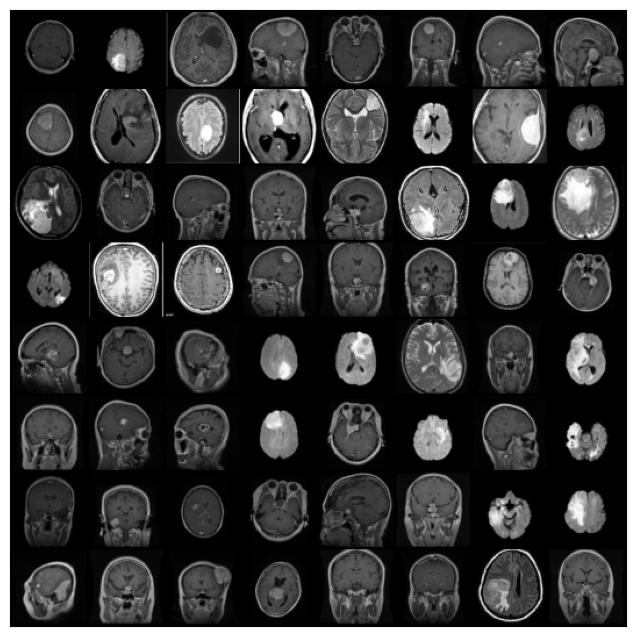

In [54]:
show_batch(train_dl)

In [55]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [56]:
device = get_default_device()
device

device(type='cuda')

In [57]:
train_dl = DeviceDataLoader(train_dl, device)

In [58]:
import torch.nn as nn

In [59]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [60]:
discriminator = to_device(discriminator, device)

In [61]:
latent_size = 128

In [62]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


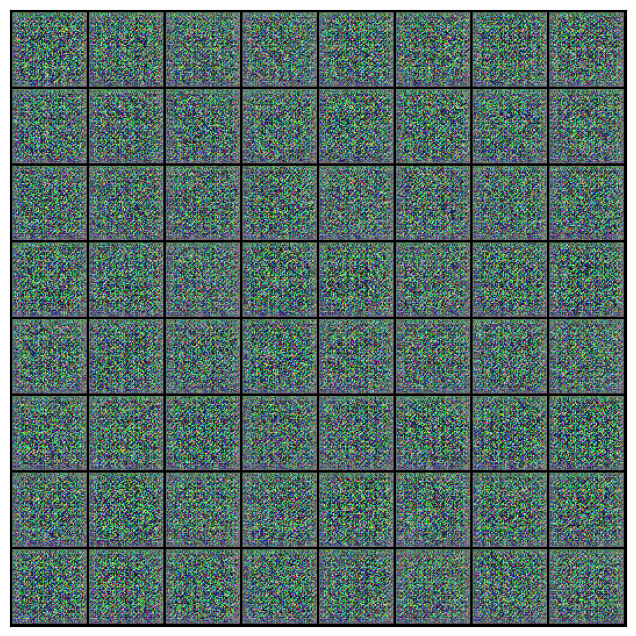

In [63]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [64]:
generator = to_device(generator, device)

In [65]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [66]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

In [67]:
from torchvision.utils import save_image

In [68]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [69]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [70]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


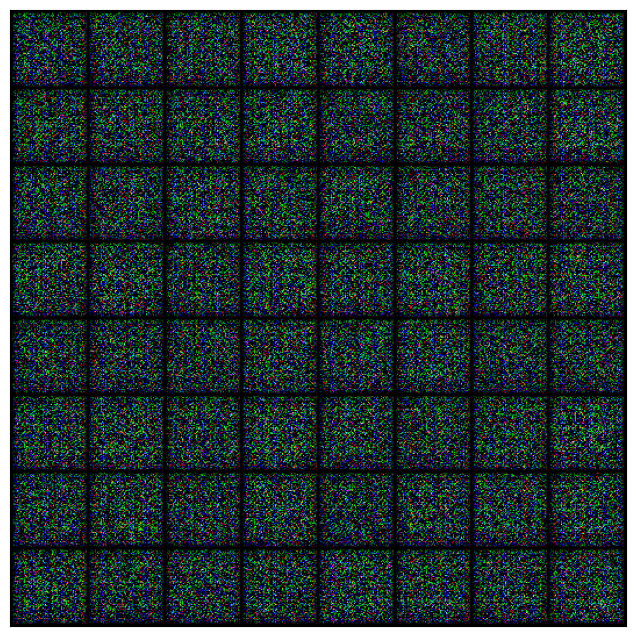

In [71]:
save_samples(0, fixed_latent)

In [72]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [73]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=True)

    return losses_g, losses_d, real_scores, fake_scores

In [74]:
lr = 0.0002
epochs = 35

  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [1/35], loss_g: 16.8136, loss_d: 0.0729, real_score: 0.9540, fake_score: 0.0000
Saving generated-images-0001.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [2/35], loss_g: 3.6739, loss_d: 0.4521, real_score: 0.8479, fake_score: 0.2188
Saving generated-images-0002.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [3/35], loss_g: 4.3557, loss_d: 0.3056, real_score: 0.8967, fake_score: 0.1566
Saving generated-images-0003.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [4/35], loss_g: 8.1016, loss_d: 0.3323, real_score: 0.9427, fake_score: 0.2181
Saving generated-images-0004.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [5/35], loss_g: 4.5107, loss_d: 0.2366, real_score: 0.9149, fake_score: 0.1177
Saving generated-images-0005.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [6/35], loss_g: 4.4783, loss_d: 0.2113, real_score: 0.9204, fake_score: 0.1036
Saving generated-images-0006.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [7/35], loss_g: 9.6173, loss_d: 0.8313, real_score: 0.9667, fake_score: 0.4624
Saving generated-images-0007.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [8/35], loss_g: 3.0494, loss_d: 0.5436, real_score: 0.8061, fake_score: 0.1925
Saving generated-images-0008.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [9/35], loss_g: 4.2994, loss_d: 0.2757, real_score: 0.9296, fake_score: 0.1446
Saving generated-images-0009.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [10/35], loss_g: 2.5489, loss_d: 0.3497, real_score: 0.7904, fake_score: 0.0539
Saving generated-images-0010.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [11/35], loss_g: 5.1544, loss_d: 0.3376, real_score: 0.9362, fake_score: 0.2155
Saving generated-images-0011.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [12/35], loss_g: 1.7972, loss_d: 0.5452, real_score: 0.7074, fake_score: 0.0633
Saving generated-images-0012.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [13/35], loss_g: 3.5167, loss_d: 0.4312, real_score: 0.8590, fake_score: 0.2182
Saving generated-images-0013.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [14/35], loss_g: 3.6946, loss_d: 0.3708, real_score: 0.7756, fake_score: 0.0316
Saving generated-images-0014.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [15/35], loss_g: 3.2383, loss_d: 0.3847, real_score: 0.8294, fake_score: 0.1339
Saving generated-images-0015.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [16/35], loss_g: 4.5513, loss_d: 0.3856, real_score: 0.9328, fake_score: 0.2411
Saving generated-images-0016.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [17/35], loss_g: 2.4027, loss_d: 0.3837, real_score: 0.8002, fake_score: 0.0931
Saving generated-images-0017.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [18/35], loss_g: 3.4103, loss_d: 0.2925, real_score: 0.8580, fake_score: 0.1033
Saving generated-images-0018.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [19/35], loss_g: 4.4059, loss_d: 0.2824, real_score: 0.9099, fake_score: 0.1580
Saving generated-images-0019.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [20/35], loss_g: 4.1069, loss_d: 0.2576, real_score: 0.9190, fake_score: 0.1404
Saving generated-images-0020.png


  0%|          | 0/86 [00:00<?, ?it/s]

/tmp/ipython-input-3553455935.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(8, 8))


Epoch [21/35], loss_g: 3.2589, loss_d: 0.2171, real_score: 0.9179, fake_score: 0.1151
Saving generated-images-0021.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [22/35], loss_g: 4.9342, loss_d: 0.2860, real_score: 0.8870, fake_score: 0.0941
Saving generated-images-0022.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [23/35], loss_g: 4.3011, loss_d: 0.3177, real_score: 0.9265, fake_score: 0.1939
Saving generated-images-0023.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [24/35], loss_g: 3.8007, loss_d: 0.2750, real_score: 0.8848, fake_score: 0.1224
Saving generated-images-0024.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [25/35], loss_g: 2.9557, loss_d: 0.1951, real_score: 0.8698, fake_score: 0.0332
Saving generated-images-0025.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [26/35], loss_g: 3.8273, loss_d: 0.1680, real_score: 0.9339, fake_score: 0.0853
Saving generated-images-0026.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [27/35], loss_g: 3.2853, loss_d: 0.2360, real_score: 0.8952, fake_score: 0.0998
Saving generated-images-0027.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [28/35], loss_g: 2.8627, loss_d: 0.1555, real_score: 0.9151, fake_score: 0.0491
Saving generated-images-0028.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [29/35], loss_g: 4.8771, loss_d: 0.3129, real_score: 0.9542, fake_score: 0.2065
Saving generated-images-0029.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [30/35], loss_g: 2.8644, loss_d: 0.2532, real_score: 0.8813, fake_score: 0.0993
Saving generated-images-0030.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [31/35], loss_g: 3.1348, loss_d: 0.2341, real_score: 0.8501, fake_score: 0.0455
Saving generated-images-0031.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [32/35], loss_g: 3.0064, loss_d: 0.2402, real_score: 0.8697, fake_score: 0.0699
Saving generated-images-0032.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [33/35], loss_g: 3.0726, loss_d: 0.3888, real_score: 0.8997, fake_score: 0.2067
Saving generated-images-0033.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [34/35], loss_g: 4.0386, loss_d: 0.3631, real_score: 0.9204, fake_score: 0.2154
Saving generated-images-0034.png


  0%|          | 0/86 [00:00<?, ?it/s]

Epoch [35/35], loss_g: 3.8398, loss_d: 0.2550, real_score: 0.9712, fake_score: 0.1867
Saving generated-images-0035.png


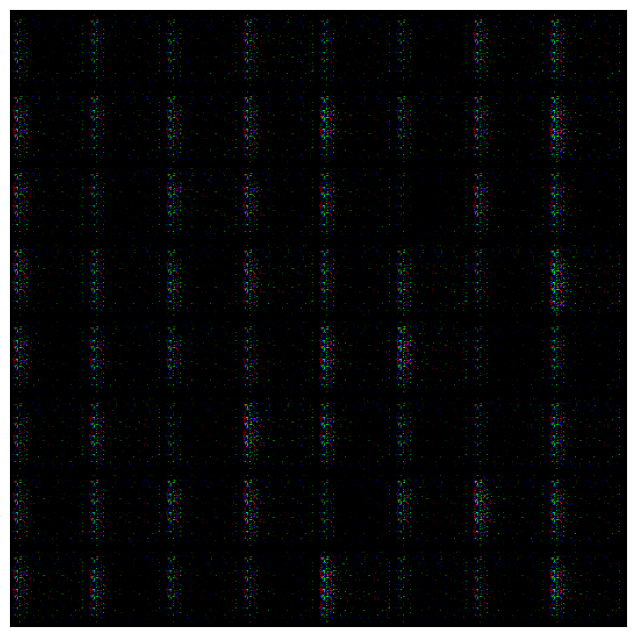

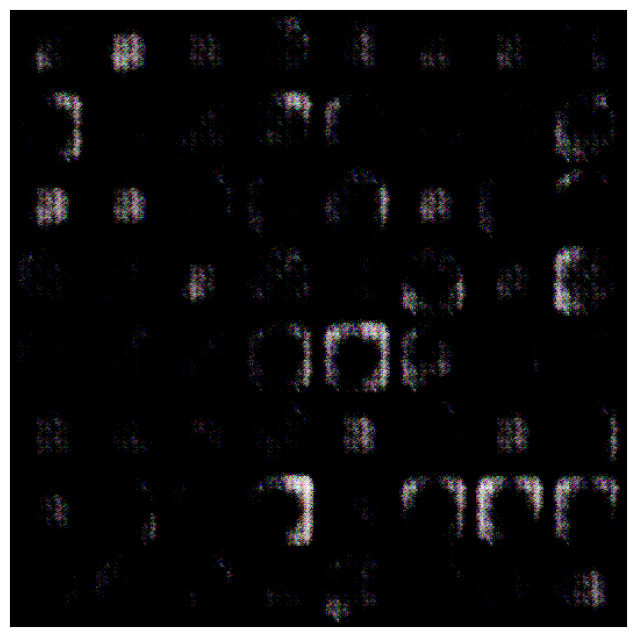

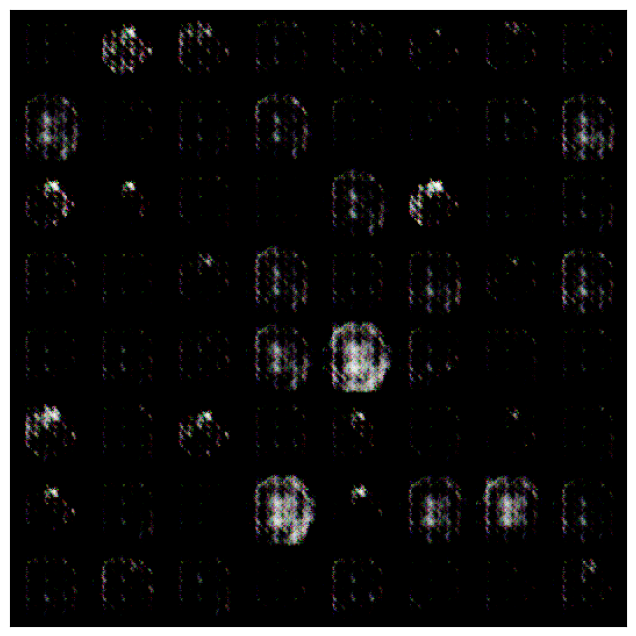

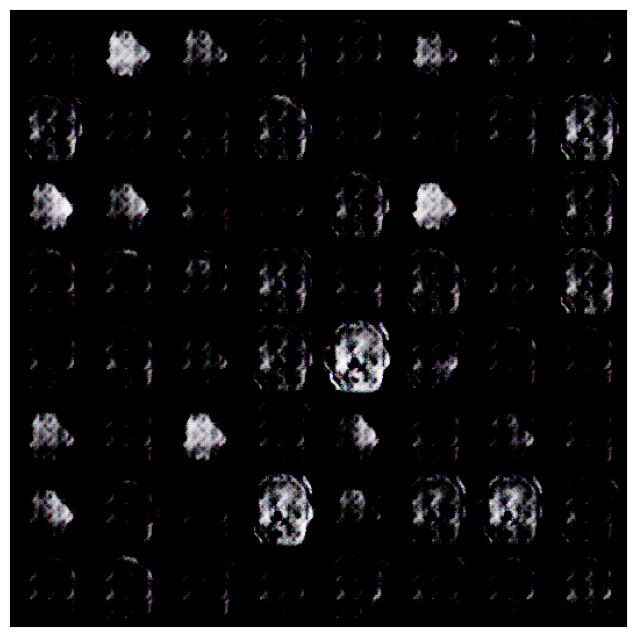

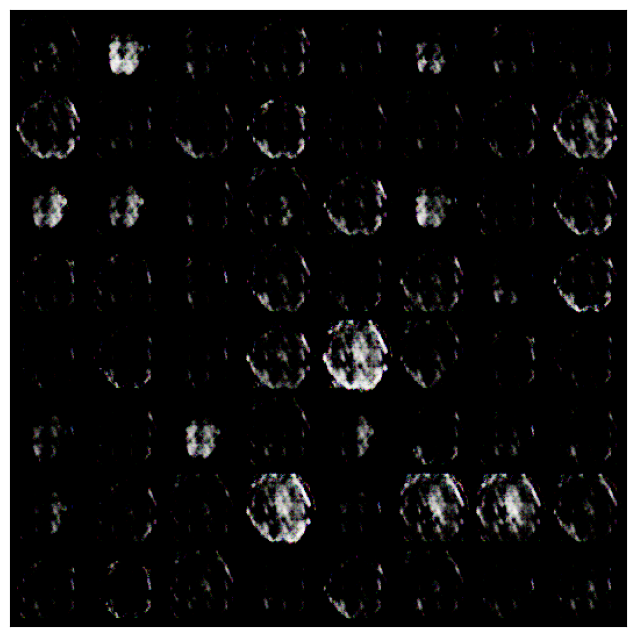

...

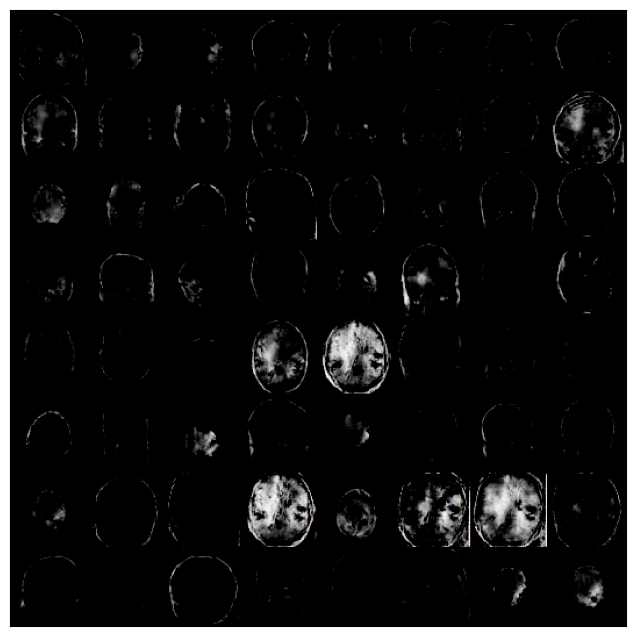

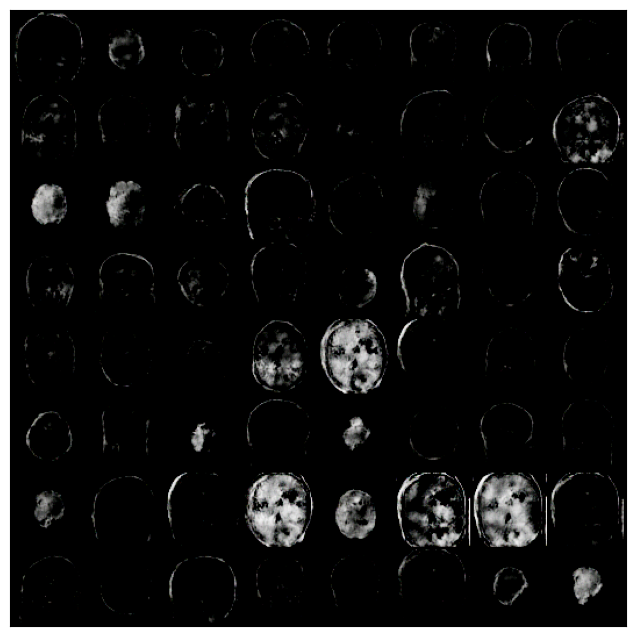

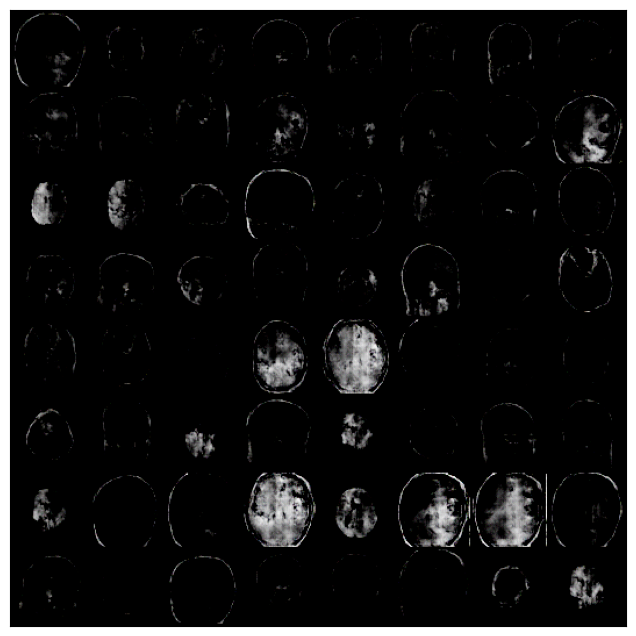

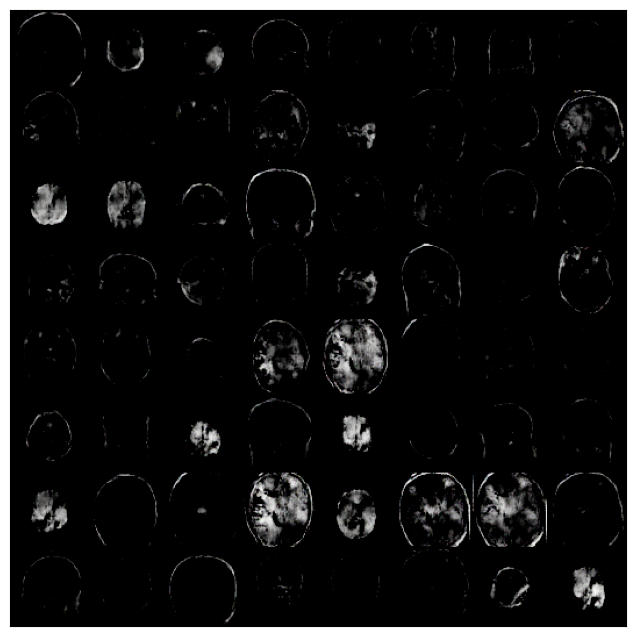

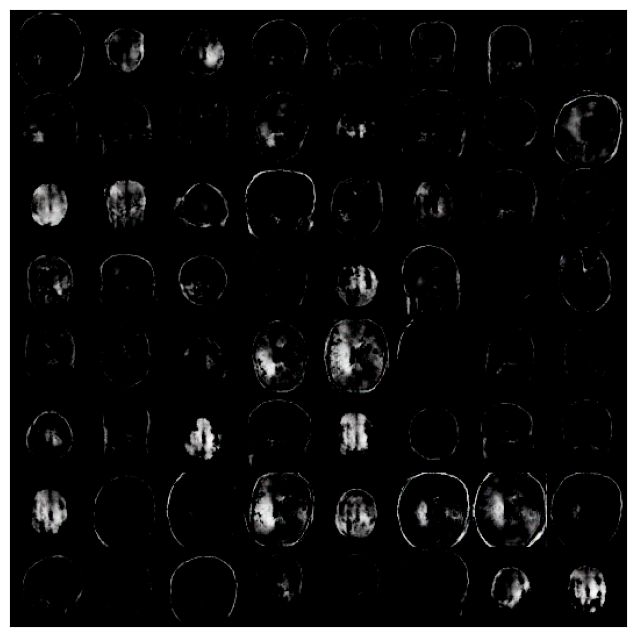

In [75]:
history = fit(epochs, lr)

In [76]:
from IPython.display import Image

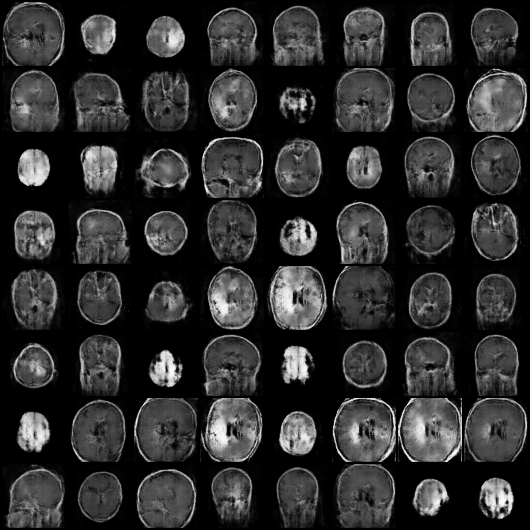

In [79]:
Image('generated/generated-images-0035.png')

git version 2.34.1
